### *Sayyidan Muhamad Ikhsan*
### *20/460160/TK/50749*

# **Senior Project: Penapisan Citra (Image Filtering)**

### **Tujuan:**
1. Memahami konsep dasar image filtering dan konvolusi
2. Mengaplikasikan konsep tersebut dalam tiga macam topik, yakni Averaging Filter, Median Filter, dan Edge Detection.
3. Mampu melakukan perbandingan dan analisis terhadap implementasi beberapa filter yang berbeda.

### **Ketentuan:**
1. Peserta praktikum hanya boleh menggunakan fungsi-fungsi yang telah disediakan dalam notebook ini.
2. Fungsi yang di-import dari luar akan dianggap suatu kesalahan yang akan mengurangi nilai dari praktikum.
3. Dilarang menggunakan fungsi-fungsi solver aljabar linear pada numpy.
4. Konvolusi dilakukan dengan memodifikasi contoh yang ada dalam source code, dilarang menggunakan built-in function / canned function yang tidak terdapat dalam notebook ini.
5. Laporan hanya boleh dikerjakan pada Lembar Kerja Image Filtering ini, dengan menambahkan nama mahasiswa dan nomor mahasiswa pada nama file Jupyter Notebook (*.ipynb).

6. Dalam lembar kerja ini terdapat enam tugas dengan skor total penilaian 100. Tugas 1 sampai dengan tugas 4 masing-masing bernilai 15. Tugas 5 dan 6 masing-masing bernilai 20. Jawaban untuk setiap tugas terdiri dari dua macam: Kode Program dan Analisis. Masukkan Kode Program dan Hasil Analisis dengan cara mengedit cell yang sudah disediakan di setiap penugasan.

7. Seluruh peserta wajib menjunjung tinggi integritas dan reputasi pribadi dengan tidak bertukar jawaban atau tidak melakukan kecurangan. Jawaban tugas (hasil analisis) dengan tingkat kemiripan di atas 30% dianggap sebagai plagiat dan tidak akan dinilai.

### **Alat dan bahan:**
1. Google Colaboratory
2. Fungsi-fungsi Python yang sudah didefinisikan dalam notebook ini.
3. Tiga macam citra untuk eksperimen: input_image.png, pattern.png, dan room.png. Citra yang digunakan dalam eksperimen dapat diunduh melalui tautan berikut: http://ugm.id/seniorimagefiltering .
Perlu diingat bahwa citra yang diunggah dalam Notebook Drive ini hanya bersifat sementara (temporary) sesuai dengan durasi session dari Google Colab. Saat session selesai, citra yang diunggah akan terhapus.



## **Topik 1: Implementasi Averaging Filter**

Program di bawah ini adalah contoh implementasi dari Averaging Filter (Mean Filter). Operasi spatial filtering menerapkan konsep konvolusi. Konvolusi pada citra 2D adalah sebuah proses untuk memperoleh nilai piksel baru didasarkan pada nilai piksel citra asal dan nilai piksel tetangga (neigbourhood) dari piksel tersebut.

Proses konvolusi melibatkan sebuah matriks konvolusi/kernel dengan ukuran tertentu. Umumnya, jumlah baris dan jumlah kolom pada kernel berukuran sama dan ganjil (misalnya: 3x3, 5x5, 7x7, dan seterusnya). Jumlah baris dan kolom diatur sesuai dengan kebutuhan. Proses konvolusi pada dasaranya adalah operasi dot product dari sebuah kernel terhadap sebuah citra, sebagaimana terhadap dalam Gambar 1 di bawah ini. Semakin besar ukuran citra, semakin lama proses ini berlangsung.


![conv](https://upload.wikimedia.org/wikipedia/commons/1/19/2D_Convolution_Animation.gif?20130203224852)

**Gambar 1.** Proses konvolusi dari pada sebuah matriks (citra) dengan kernel berukuran 3x3


#### **Averaging kernel**
**Uniform Blur** merupakan kernel yang memiliki elemen yang seragam (uniform) dengan jumlah dari semua elemennya sama dengan satu kemudian kemudian dikalikan dengan jumlahnya (menjadi elemen rata-rata). Kernel ini juga sering kali  disebut sebagai low pass filter. Berikut merupakan salah satu contoh kernel blur ukuran $3\times3$,
$$
\frac{1}{9}
\begin{bmatrix}
\ \ 1 &\ \  1 & 1 \\
\ \ 1 &\ \  1 & \ \ 1 \\
\ 1 &\ \  1 & \ \ 1
\end{bmatrix}\tag{2.2}
$$

Selain itu terdapat kernel bluring yang lain yang melakukan operasi serupa seperti halnya kernel **Gaussian Blur** atau **Weighted Averaging Filter** yang melakukan operasi rerata pada citra namun dengan bentuk kurva Gaussian.

$$
\frac{1}{16}
\begin{bmatrix}
\ \ 1 &\ \  2 &\ \  1 \\
\ \ 2 &\ \  4 &\ \  2 \\
\ \ 1 &\ \  2 &\ \  1
\end{bmatrix}
$$


Kode 1.1 di bawah ini berfungsi untuk mengunggah citra di Google Colaboratory. Untuk keperluan eksperimen dan pengerjaan tugas, Anda diminta untuk mengunggah citra "**input_image.png**". Perlu diingat bahwa berkas citra akan terhapus saat session Google Colaboratory Anda selesai. Silahkan jalankan program di bawah ini dan unggah citra "**input_image.png**".

In [ ]:
# Kode 1.1: Program untuk mengunggah citra di Google Colab
# Catatan: file citra akan terhapus jika session selesai
from google.colab import files
import cv2
import matplotlib.pyplot as plt



In [ ]:
#untuk mempersingkat waktu, dan tidak perlu mengupload kembali citra ketika runtime terhenti
#praktikan hubungkan colab dengan drive

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#inisiasi path image yang baru
input_image = '/content/drive/MyDrive/SP Image Processing/input_image.png'
pattern = '/content/drive/MyDrive/SP Image Processing/pattern.png'
room = '/content/drive/MyDrive/SP Image Processing/room.png'

Kode 1.2 di bawah ini adalah contoh implementasi Averaging Filter dengan ukuran kernel 3x3 berjenis Uniform Blur. Perhatikan langkah demi langkah yang ada dalam kode program di bawah ini. Jalankan program di bawah ini lalu amati hasil dari Averaging Filter.

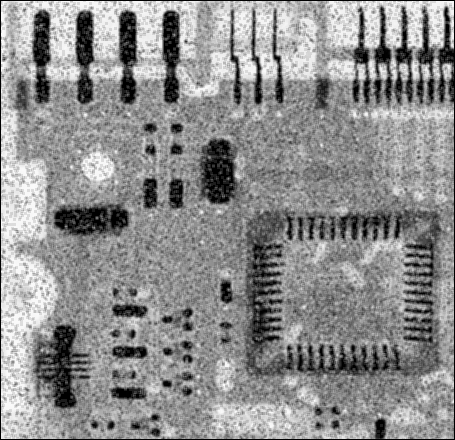

In [ ]:
# Kode 1.2: Implementasi Averaging Filter
# Sebelum menjalankan program ini, unggah citra dengan nama 'input_image.png'

import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# Baca citra yang sudah diunggah pada sistem
img = cv2.imread(input_image, 0)

# Identifikasi jumlah baris dan kolom pada citra
m, n = img.shape

# Inisiasi Averaging Filter (3,3)
# Nilai pada masing-masing elemen kernel adalah 1/9
mask = np.ones([3, 3], dtype = int)
mask = mask / 9

# Proses konvolusi filter pada citra
img_new = np.zeros([m, n])

for i in range(1, m-1):
    for j in range(1, n-1):
        temp = img[i-1, j-1]*mask[0, 0]+img[i-1, j]*mask[0, 1]+img[i-1, j + 1]*mask[0, 2]+img[i, j-1]*mask[1, 0]+ img[i, j]*mask[1, 1]+img[i, j + 1]*mask[1, 2]+img[i + 1, j-1]*mask[2, 0]+img[i + 1, j]*mask[2, 1]+img[i + 1, j + 1]*mask[2, 2]

        img_new[i, j]= temp

#Simpan citra hasil Averaging Filter dan tampilkan
img_new = img_new.astype(np.uint8)
cv2.imwrite('averaging_result.png', img_new)
cv2_imshow(img_new)

---
#### **TUGAS 1:**
**[POIN PENILAIAN: 15]**

---



Buatlah sebuah Weighted Averaging Filter dengan memodifikasi contoh kode program di atas. Selesaikan tugas berikut:

1. Tampilkan kernel yang Anda gunakan, sehingga Anda dapat mengamati nilai masing-masing elemen pada kernel Weighted Averaging Filter.

2. Kemudian lakukan konvolusi antara Weighted Averaging Filter dengan citra **input_image.png**.

2. Amati perbedaan antara hasil konvolusi Averaging Filter dan Weighted Averaging Filter. Apa pengaruh Weighted Averaging Filter pada citra hasil konvolusi dibandingkan dengan Averaging Filter?  





[[0.0625 0.125  0.0625]
 [0.125  0.25   0.125 ]
 [0.0625 0.125  0.0625]]


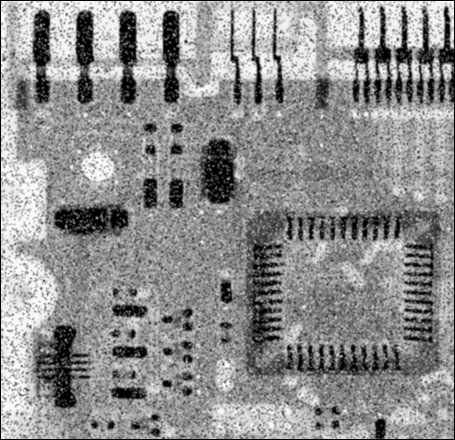

In [ ]:
# JAWABAN TUGAS 1

# Citra sudah tersimpan di variable img jadi tidak perlu mengunggahnya lagi
# Jumlah baris dan kolom citra sudah diidentifikasi dan disimpan di variabel m,n

# Inisiasi Weighted Averaging Filter (3,3)
# Nilai pada masing-masing elemen kernel adalah 1/16
mask = np.array([[1,2,1],[2,4,2],[1,2,1]], dtype = int)
mask = mask / 16

# Proses konvolusi filter pada citra
img_new = np.zeros([m, n])

for i in range(1, m-1):
    for j in range(1, n-1):
        temp = img[i-1, j-1]*mask[0, 0]+img[i-1, j]*mask[0, 1]+img[i-1, j + 1]*mask[0, 2]+img[i, j-1]*mask[1, 0]+ img[i, j]*mask[1, 1]+img[i, j + 1]*mask[1, 2]+img[i + 1, j-1]*mask[2, 0]+img[i + 1, j]*mask[2, 1]+img[i + 1, j + 1]*mask[2, 2]

        img_new[i, j]= temp

#Menampilkan nilai kernel yang digunakan
print(mask)

#Simpan citra hasil Weighted Averaging Filter dan tampilkan
img_new_weighted_average = img_new.astype(np.uint8)
cv2.imwrite('averaging_result.png', img_new)
cv2_imshow(img_new)

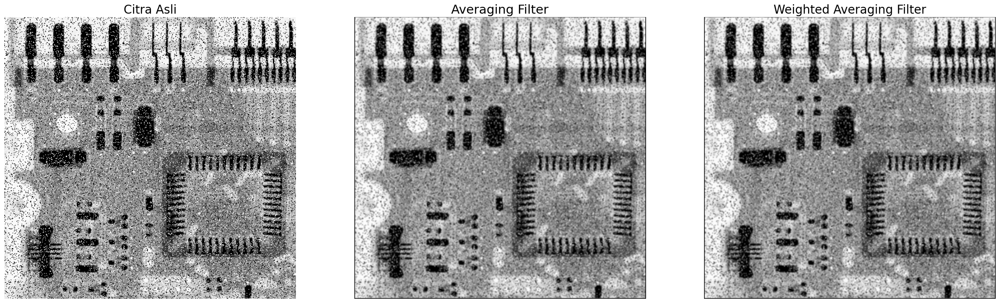

In [ ]:
#Menampilkan citra asli dan citra hasil filtering untuk memudahkan dalam perbandingan

fig, ax = plt.subplots(1, 3, figsize=(30,30))
ax[0].set_title(f'Citra Asli', fontsize = 20)
ax[0].imshow(img, cmap='gray')
ax[0].set_axis_off()

ax[1].set_title(f'Averaging Filter', fontsize = 21)
ax[1].imshow(img_new, cmap='gray')
ax[1].set_axis_off()

ax[2].set_title(f'Weighted Averaging Filter', fontsize = 20)
ax[2].imshow(img_new_weighted_average, cmap='gray')
ax[2].set_axis_off()

#### **JAWABAN TUGAS 1 : tuliskan hasil analisis Anda pada gambar hasil konvolusi (soal no. 3)**

Secara kasat mata, kita mungkin sulit untuk melihat perbedaan antara *Averaging Filter* dengan *Weighted Averaging Filter*. Akan tetapi, apabila dilihat lebih teliti, terlihat bahwa gambar hasil *Weighted Averaging Filter* memiliki hasil yang lebih baik dalam menjaga ketajaman garis tepi (edge) pada citra dibandingkan dengan averaging filter. Terlihat pada averaging filter memiliki garis tepi yang cenderung lebih buram dibandingkan weighted averaging filter.

Hal ini disebabkan karena pada *Weighted Averaging Filter* memiliki bobot kernel yang berbeda sehingga bobot yang diberikan pada piksel yang lebih dekat pada titik tertentu akan memiliki nilai yang lebih tinggi.

Pada bagian noise, praktikan kesulitan untuk melihat perbedaan citra yang dihasilkan dua filter yang berbeda ini sehingga praktikan menyimpulkan bahwa Averaging Filter dan Weighted Averaging Filter memiliki performa yang mirip dalam hal menghilangkan noise atau derau



---


#### **TUGAS 2:**

**[POIN PENILAIAN: 15]**


---


Buatlah dua macam Averaging Filter dengan ukuran 5x5 dan 7x7. Untuk memudahkan proses konvolusi, gunakan fungsi berikut ini:

```
def convolution2d(image, kernel):
    m, n = kernel.shape
    if (m == n):
        y, x = image.shape
        y = y - m + 1
        x = x - m + 1
        new_image_conv = np.zeros((y,x))
        for i in range(y):
            for j in range(x):
                new_image_conv[i][j] = np.sum(image[i:i+m, j:j+m]*kernel)
        return new_image_conv
```

Selesaikan tugas berikut:

1. Tampilkan dua macam kernel yang Anda gunakan, sehingga Anda dapat mengamati nilai masing-masing elemen pada kernel Averaging Filter berukuran 5x5 dan 7x7.

2. Kemudian lakukan konvolusi antara masing-masing Averaging Filter tersebut dengan citra **input_image.png**.

3. Amati perbedaan antara hasil konvolusi Averaging Filter berukuran 3x3, 5x5, dan 7x7. Apa pengaruh peningkatan ukuran kernel pada hasil konvolusi?




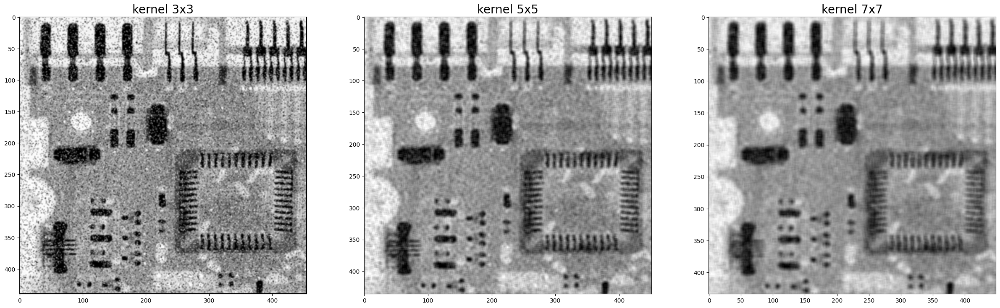

In [ ]:
# JAWABAN TUGAS 2
# TULISKAN KODE PROGRAM ANDA DI SINI

def convolution2d(image, kernel):
    m, n = kernel.shape
    if (m == n):
        y, x = image.shape
        y = y - m + 1
        x = x - m + 1
        new_image_conv = np.zeros((y,x))
        for i in range(y):
            for j in range(x):
                new_image_conv[i][j] = np.sum(image[i:i+m, j:j+m]*kernel)
        return new_image_conv

# Inisiasi filter 5x5 dan 7x7
mask55 = np.ones([5,5], dtype = int)/25
mask77 = np.ones([7,7], dtype = int)/49

# Proses konvolusi
result_Averaging_Filter_55 = convolution2d(img,mask55)
result_Averagin_Filter_77 = convolution2d(img,mask77)

#tampilkan citra
fig, ax = plt.subplots(1,3, figsize=(30,30))
ax[0].set_title(f'kernel 3x3', fontsize = 20)
ax[0].imshow(abs(img_new), cmap='gray')

ax[1].set_title(f'kernel 5x5', fontsize = 20)
ax[1].imshow(abs(result_Averaging_Filter_55), cmap='gray')

ax[2].set_title(f'kernel 7x7', fontsize = 20)
ax[2].imshow(abs(result_Averagin_Filter_77), cmap='gray');

#### **JAWABAN TUGAS 2 : tuliskan hasil analisis Anda pada gambar hasil konvolusi (soal no. 3)**

Perbedaan antara hasil konvolusi Averaging Filter berukuran 3x3, 5x5, dan 7x7. Terlihat jelas pada tingkat kehalusan citra.

Seperti yang kita lihat, hasil konvolusi menggunakan kernel 5x5 memiliki performa lebih baik dalam menghilangkan noise dibandingkan dengan kernel 3x3. Akan tetapi, Semakin besar peningkatan ukuran kernel, dapat meningkatkan tingkat keburaman yang terjadi, seperti yang kita lihat pada hasil konvolusi kernel 7x7.

Hal ini terjadi karena pada kernel filter yang lebih besar akan menghitung rata-rata dengan piksel yang lebih banyak sehingga detail pada citra akan menghilang.

## **Topik 2: Implementasi Median Filter**

Median Filter adalah salah satu teknik spatial filtering dalam pengolahan citra yang digunakan untuk peningkatan kualitas citra, terutama dengan menghilangkan derau (noise) pada sebuah citra. Median filter bekerja dengan cara mengganti nilai piksel tertentu dengan posisi tengah (median) dari nilai keabuan seluruh piksel yang ada di sekeliling piksel tersebut.   

Dengan kata lain, piksel tengah akan diolah menggunakan nilai keabuan tetangga. Nilai keabuan baru yang akan muncul "diakui" sebagai nilai baru yang menggantikan nilai asli. Dengan demikian, nilai piksel yang diperoleh akan "menyerupai" nilai tetangganya dan pada akhirnya dapat meningkatkan kualitas citra (lihat Gambar 2).

![median](https://upload.wikimedia.org/wikipedia/commons/a/ae/Median_filter_2D.gif?20190428090716)

**Gambar 2.** Ilustrasi Median Filtering

Kode 2.1 di bawah ini merupakan implementasi Median Filter dengan ukuran kernel 3x3. Perhatikan langkah demi langkah yang ada dalam kode program di bawah ini. Sebagai bahan eksperimen, Anda diminta untuk menggunakan citra "**input_image.png**" dan mengunggahnya di drive Google Colaboratory.

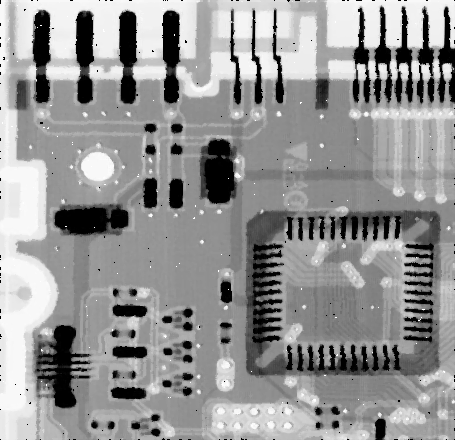

In [ ]:
# Kode 2.1: Implementasi Median Filter
# Sebelum menjalankan program ini, unggah citra dengan nama 'input_image.png'

import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# Baca citra yang sudah diunggah pada sistem
img_noisy1 = cv2.imread(input_image, 0)

# defiisikan fungsi medianFilter
# k adalah ukuran kernel
# w adalah width, h adalah height

def medianFilter(img,k):
  w,h = img.shape
  size = k // 2

  # Buat output image dengan nilai awal nol dan lakukan padding
  _img = np.zeros((w+2*size,h+2*size), dtype=float)
  _img[size:size+w,size:size+h] = img.copy().astype(float)
  dst = _img.copy()

  # Proses filtering
  for x in range(w):
    for y in range(h):
        dst[x+size,y+size] = np.median(_img[x:x+k,y:y+k])

  dst = dst[size:size+w,size:size+h].astype(np.uint8)
  return dst

# Tampilkan citra hasil Median Filter
img_new1 = medianFilter(img_noisy1,3)
img_new1 = img_new1.astype(np.uint8)
cv2.imwrite('median_filter_result.png', img_new1)
cv2_imshow(img_new1)



---


#### **TUGAS 3:**

**[POIN PENILAIAN: 15]**


---



1. Bandingkan hasil dari Median Filter dan Averaging Filter. Mengapa hasil Median Filter lebih baik daripada Averaging Filter? Jelaskan jawaban Anda.

2. Apakah Median Filter berpengaruh terhadap garis batas (edge) yang ada di gambar "**input_image.png**"?



#### **JAWABAN TUGAS 3 : tuliskan hasil analisis Anda**

1. Seperti yang kita lihat, hasil yang didapatkan dengan menggunakan Median Filter memiliki citra yang jauh lebih tegas dan halus dibandingkan dengan hasil Averaging Filter. Hal ini disebabkan karena averaging filter pada dasarnya menghitung rata-rata nilai piksel disekitarnya sehingga apabila terdapat banyak piksel yang memiliki noise yang sangat berbeda dengan nilai sekitarnya dapat menghasilkan nilai yang salah pada hasil filtering. Sedangkan, pada median filter menghitung nilai median pada area disekitarnya untuk mengganti nilai piksel tertentu. Dengan menggunakan konsep median ini, nilai yang didapat tidak akan terpengaruh oleh nilai noise yang ekstrim atau terlalu banyak.

  Meskipun demikian, hasil averaging filter mungkin saja dapat lebih baik apabila citra yang di olah memiliki noise yang lebih hasul dan tidak terlalu banyak atau ekstrim.

2. Iya, median filter dapat berpengaruh pada garis tepi. Seperi yang kita lihat, hasil median filter memiliki garis tepi yang lebih tegas dan jelas dibandingkan dengan hasil averaging filter.



---


#### **TUGAS 4:**

**[POIN PENILAIAN: 15]**


---



Buatlah dua buah Median Filter yang berukuran 3x3 dan 5x5. Lakukan konvolusi pada citra baru bernama "**pattern.png**". Apa pengaruh semakin besarnya ukuran kernel pada citra hasil konvolusi?



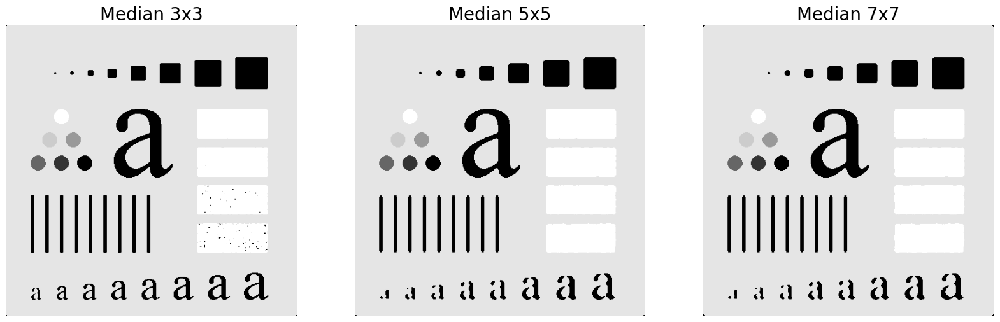

In [ ]:
# JAWABAN TUGAS 4
# TULISKAN KODE PROGRAM ANDA DI SINI

#membaca citra pattern
img = cv2.imread(pattern,0)

#median filter 3x3
median33 = medianFilter(img,3)
median33 = median33.astype(np.uint8)

#median filter 5x5
median55 = medianFilter(img,5)
median55 = median55.astype(np.uint8)

#median filter 7x7
median55 = medianFilter(img,7)
median55 = median55.astype(np.uint8)

#menampilkan hasil
fig, ax = plt.subplots(1, 3, figsize=(20,20))
ax[0].set_title(f'Median 3x3', fontsize = 20)
ax[0].imshow(abs(median33), cmap='gray')
ax[0].set_axis_off()

ax[1].set_title(f'Median 5x5', fontsize = 20)
ax[1].imshow(abs(median55) , cmap='gray')
ax[1].set_axis_off()

ax[2].set_title(f'Median 7x7', fontsize = 20)
ax[2].imshow(abs(median55) , cmap='gray')
ax[2].set_axis_off()

#### **JAWABAN TUGAS 4 : tuliskan hasil analisis Anda**

Semakin besar ukuran kernel yang digunakan, semakin besar pula area yang akan dihitung untuk mencari nilai mediannya. Apabila dibandingkan, kita dapat melihat bahwa kotak-kotak putih pada kernel 3x3 masih memiliki derau sedangkan pada kernel 5x5 dan 7x7 terlihat bersih dari derau. Dengan demikian, semakin besar ukuran kernel, semakin baik juga dalam menghilangkan derau. Namun, apabila diperhatikan pada kotak paling kiri dan huruf a kecil, pada kernel yang lebih besar terjadi pengaburan detail, huruf a kecil terlihat masih cukup utuh dan kotak kecil masih terlihat hanya pada pada kernel 3x3, sedangkan pada kernel 5x5 dan 7x7 huruf a kecil memiliki bagian yang hilang dan kotak kecilnya juga hilang.

Oleh karena itu, pemilihan ukuran kernel harus disesuaikan dan dicoba berulang kali agar menghasilkan hasil yang memuaskan. Jika noise sangat halus, ukuran kernel yang kecil mungkin sudah cukup menghilangkannya tanpa terjadi pengaburan pada detail

## **Topik 3: Implementasi Edge Detection (Deteksi Tepi)**

Deteksi tepi (edge detection) merupakan sebuah operasi dalam pengolahan citra untuk mendeteksi garis tepi (edges) yang membatasi dua wilayah citra homogen yang memiliki tingkat kecerahan yang berbeda. Deteksi tepi sebuah citra digital merupakan proses untuk mencari perbedaan intensitas yang menyatakan batas-batas suatu objek (sub-citra) dalam keseluruhan citra digital yang dimaksud. Tujuan pendeteksian tepi adalah untuk meningkatkan penampakan garis batas suatu daerah atau objek di dalam citra. Proses deteksi tepi citra dilakukan dengan mencari lokasi-lokasiintensitas pixel-pixel yang discontinue dengan intensitas pixel-pixel yang berdekatan (bertetanggaan/neighborhood).

Pada Topik ke-3 ini, Anda diminta untuk mengimplementasikan algoritme deteksi tepi pada sebuah citra yang bernama '**room.png**'. Langkah pertama (Kode 3.1) adalah mengunggah citra tersebut dan mengubah tipe citra dari RGB menjadi gray scale. Setelah itu, Anda akan mengimplementasikan dua buah metode deteksi tepi, yakni metode Laplacian (Laplacian Filter) sederhana pada Kode 3.2 dan metode Sobel (Sobel Filter) pada Kode 3.3 dan Kode 3.4.

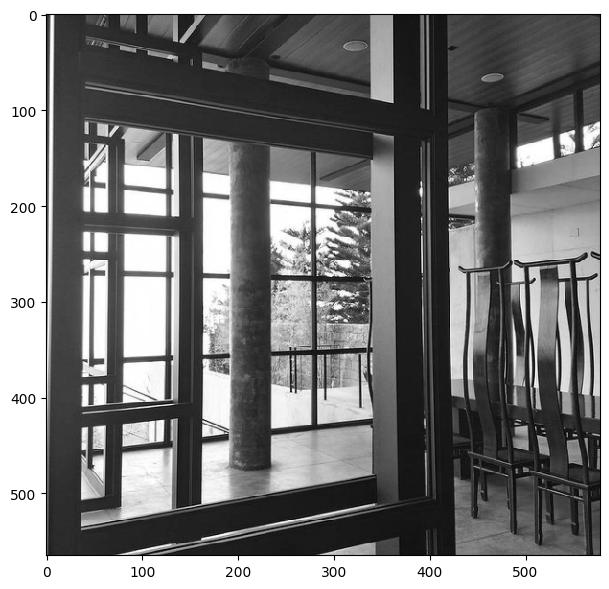

In [ ]:
# Kode 3.1: Mengubah citra RGB menjadi citra gray-scale
# Sebelum menjalankan program ini, unggah citra dengan nama 'room.png'

import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage.io import imread, imshow
from skimage.color import rgb2gray
from skimage import img_as_uint

morph = imread(room)
plt.figure(num=None, figsize=(8, 6), dpi=100)
morph_gray = rgb2gray(morph)
imshow(morph_gray);

Kode 3.2 merupakan contoh konvolusi dan implementasi dari metode deteksi tepi berbasis Laplacian. Jalankan kode program dan amati proses dalam kode program tersebut secara cermat.

/usr/local/lib/python3.10/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


True

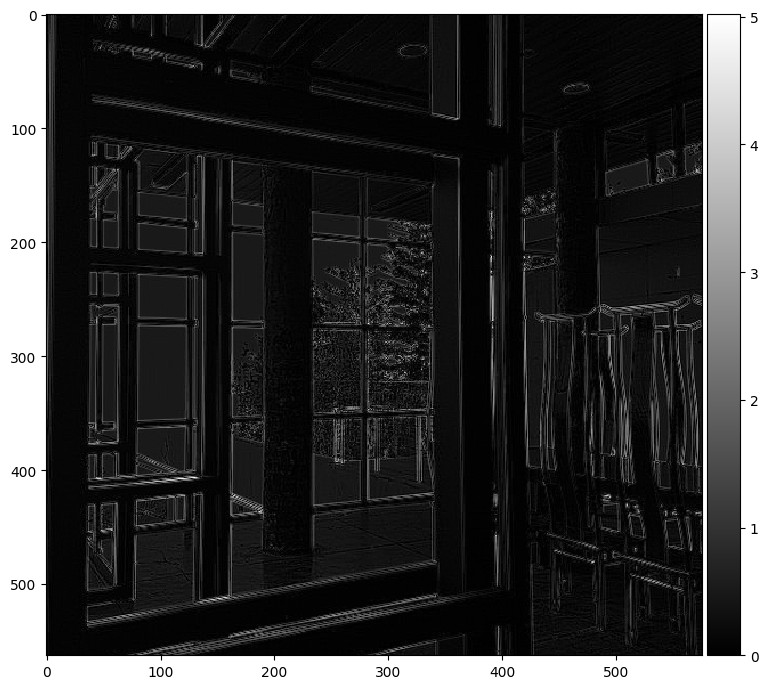

In [ ]:
# Kode 3.2: Melakukan konvolusi dengan kernel sederhana (Laplacian)

kernel_edgedetection = np.array([[-1, -1, -1],
                                 [-1, 8.5, -1],
                                 [-1, -1, -1]])



def convolution2d(image, kernel):
    m, n = kernel.shape
    if (m == n):
        y, x = image.shape
        y = y - m + 1
        x = x - m + 1
        new_image_conv = np.zeros((y,x))
        for i in range(y):
            for j in range(x):
                new_image_conv[i][j] = np.sum(image[i:i+m, j:j+m]*kernel)
        return new_image_conv

fig, ax = plt.subplots(1, 1, figsize=(10,7))
conv_im1 = convolution2d(morph_gray, kernel_edgedetection)
imshow(abs(conv_im1) , cmap='gray');
cv2.imwrite('edge_detection_result.png', conv_im1)

Kode 3.3 dan 3.4 adalah contoh implementasi deteksi tepi dengan Sobel Filter. Jalankan kode program dan amati proses dalam kode program tersebut secara cermat.

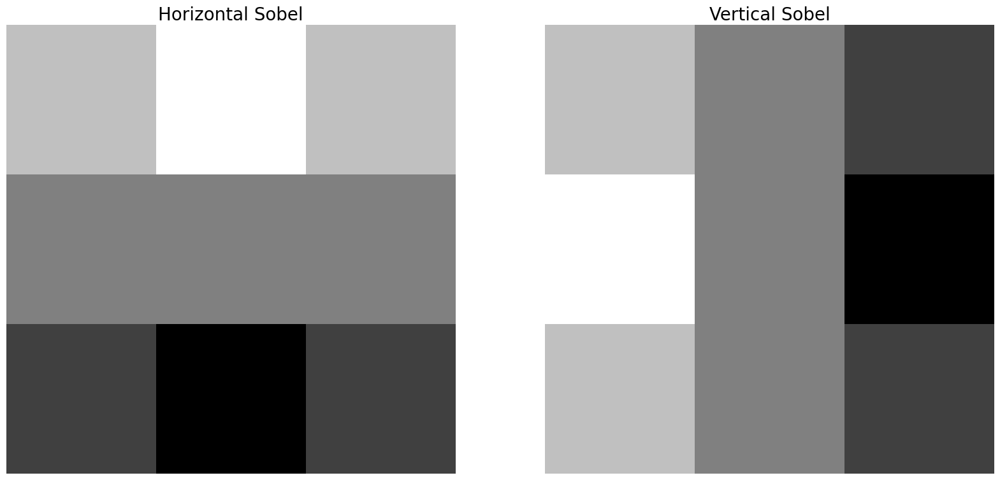

In [ ]:
# Kode 3.3: Mendefinisikan Sobel Filter untuk Edge Detection

# Horizontal Sobel Filter
h_sobel = np.array([[1, 2, 1],
                    [0, 0, 0],
                    [-1, -2, -1]])
# Vertical Sobel Filter
v_sobel = np.array([[1, 0, -1],
                    [2, 0, -2],
                    [1, 0, -1]])

fig, ax = plt.subplots(1, 2, figsize=(20,20))
ax[0].set_title(f'Horizontal Sobel', fontsize = 20)
ax[0].imshow(h_sobel, cmap='gray')
ax[0].set_axis_off()
ax[1].set_title(f'Vertical Sobel', fontsize = 20)
ax[1].imshow(v_sobel , cmap='gray')
ax[1].set_axis_off()

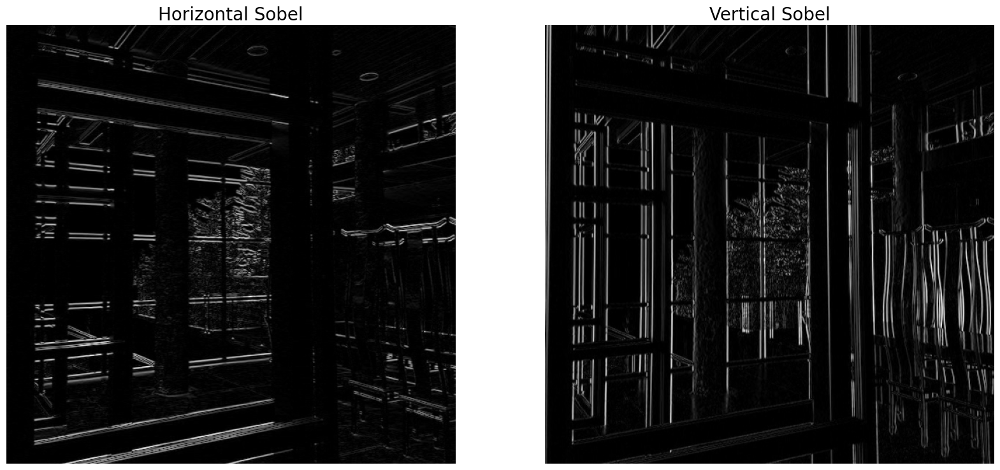

In [ ]:
# Kode 3.4: Implementasi Sobel Filter

fig, ax = plt.subplots(1, 2, figsize=(20,20))
ax[0].set_title(f'Horizontal Sobel', fontsize = 20)
ax[0].imshow(abs(convolution2d(morph_gray, h_sobel)), cmap='gray')
ax[0].set_axis_off()

ax[1].set_title(f'Vertical Sobel', fontsize = 20)
ax[1].imshow(abs(convolution2d(morph_gray, v_sobel)) , cmap='gray')
ax[1].set_axis_off()



---


#### **TUGAS 5:**

**[POIN PENILAIAN: 20]**


---



Implementasikan tiga hal di bawah ini:

a. Dengan menggunakan numpy array, buatlah sebuah metode deteksi tepi dengan kernel Laplacian yang berbeda, yakni:

$ED_1=
\begin{bmatrix}
\ \ 1 &\ \  0 & -1 \\
\ \ 0 &\ \  0 & \ \ 0 \\
 - 1 &\ \  0 & \ \ 1
\end{bmatrix}
$

$ED_2=\begin{bmatrix}
\ \ 0 &  -1 & \ \ 0 \\
-1 &\ \  4 & -1 \\
\ \ 0 &  -1 & \ \ 0
\end{bmatrix}$

$ED_3=\begin{bmatrix}
1 &  1 & 1 \\
1 & \ \ -8 & 1 \\
1 &  1 & 1
\end{bmatrix}$

  Dengan menggunakan library `Matplotlib` dan fungsi `subplot`, tampilkan tiga citra hasil deteksi tepi dengan kernel di atas dalam tiga kolom, masing-masing kolom berisi citra hasil deteksi dengan kernel $ED_1$, $ED_2$, dan $ED_3$. Jangan lupa memberi judul yang berbeda pada setiap kolom.

b. Lakukan analisis pada ketiga citra hasil deteksi tepi di atas. Pada bagian apa hasil deteksi tepi berbeda dan jika berbeda, mengapa?

c. Apa perbedaan utama dari tiga kernel di atas dengan Sobel Filter?

d. Menurut Anda, kapan dan pada kasus seperti apa ketiga kernel di atas dan Sobel Filter diimplementasikan? Bagaimana memastikan pilihan metode deteksi tepi Anda adalah yang terbaik di antara pilihan lainnya?  

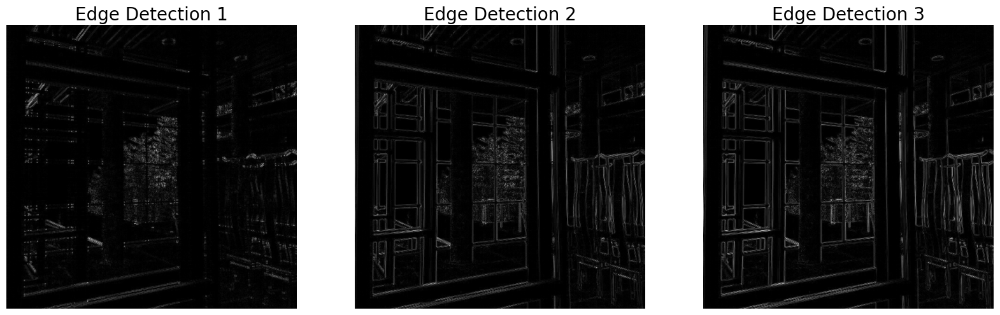

In [ ]:
# JAWABAN TUGAS 5
# TULISKAN KODE PROGRAM ANDA DI SINI

#inisiasi kernel laplacian
ed1 = np.array([[1, 0, -1],
                [0, 0, 0],
                [-1, 0, 1]])
ed2 = np.array([[0, -1, 0],
                [-1, 4, -1],
                [0, -1, 0]])
ed3 = np.array([[1, 1, 1],
                [1, -8, 1],
                [1, 1, 1]])

#Implementasi Edge Detection menggunakan kernel laplacian
fig, ax = plt.subplots(1, 3, figsize=(20,20))
ax[0].set_title(f'Edge Detection 1', fontsize = 20)
ax[0].imshow(abs(convolution2d(morph_gray, ed1)), cmap='gray')
ax[0].set_axis_off()

ax[1].set_title(f'Edge Detection 2', fontsize = 20)
ax[1].imshow(abs(convolution2d(morph_gray, ed2)) , cmap='gray')
ax[1].set_axis_off()

ax[2].set_title(f'Edge Detection 3', fontsize = 20)
ax[2].imshow(abs(convolution2d(morph_gray, ed3)) , cmap='gray')
ax[2].set_axis_off()

#### **JAWABAN TUGAS 5 : tuliskan hasil analisis Anda**

b. Analisa
   
   Apabila kita perhatikan pada tiga hasil citra diatas, terlihat jelas bahwa Edge detection 1 tidak memiliki performa yang baik dalam mendeteksi tepi. Sedangkan, pada edge detection 2 dan 3 dapat dengan baik mendeteksi tepi. Perbedaan antara edge detection 2 dan 3 terlihat pada tingkat kejelasan garis tepi. Edge detection 3 memiliki garis tepi yang lebih jelas dibandingkan dengan Edge detection 2.

c. perbedaan utama 3 kernel diatas dengan sobel filter
Perbedaan utama terletak pada bobot yang dimiliki oleh kernel dan hasil deteksi edgenya. Sobel kernel terdiri dari dua matriks yaitu sobel horizontal dan sobel vertikal. Seperti terlihat pada hasil sobel filtering, sobel horizontal menyoroti garis tepi yang memiliki arah horizontal saja dan sobel vertikal menyoroti garis tepi yang memiliki arah vertikal saja. Sedangkan, pada kernel laplacian dapat menyoroti semua garis tepi baik arah horizontal maupun vertikal. Selain itu, pada kernel sobel menghasilkan garis tepi yang lebih jelas dan tegas dibandingkan pada kernel laplacian

d. Karena kernel sobel hanya dapat mendeteksi garis tepi yang memiliki arah yang sama (horizontal atau vertikal), kernel ini cocok untuk mendeteksi garis tepi citra yang memiliki arah yang jelas (horizontal atau vertikal). Selain itu, kernel ini juga cocok digunakan apabila kita hanya ingin mendeteksi objek yang memiliki arah horizontal atau vertikal saja misalnya bangunan yang memiliki bentuk garis lurus. Sedangkan, kernel laplacian dapat mendeteksi tepi yang tidak memiliki arah yang pasti sehingga dapat digunakan untuk mendeteksi citra yang memiliki garis tepi dengan arah yang tidak jelas sehingga cocok untuk citra yang memiliki banyak kontur misalnya pegunungan. Dengan demikian, untuk memastikan metode mana yang terbaik diantara kedua metode ini bergantung pada citra yang diolah dan tujuan yang kita inginkan.



---


#### **TUGAS 6:**

**[POIN PENILAIAN: 20]**


---


a. Dengan menggunakan contoh program di atas, implementasikan Scharr Filter tanpa didahului dan dengan didahului oleh Gaussian Blur (Weighted Average Filter). Setelah itu, tampilkan hasil implementasi tersebut pada tabel 2x2. Baris pertama dan dua kolom di baris pertama berisi hasil implementasi Scharr Filter tanpa didahului Gaussian Blur. Baris kedua dan dua kolom di baris kedua berisi hasil implementasi Scharr Filter dengan didahului Gausiaan Blur. Adapun kernel pada Scharr Filter sebagai berikut:

$Scharr_{hor}=
\begin{bmatrix}
\ \ 3 &\ \  10 & 3 \\
\ \ 0 &\ \  0 & \ \ 0 \\
 - 3 &\ \  -10 & \ \ -3
\end{bmatrix}
$

$Scharr_{ver}=
\begin{bmatrix}
\ \ 3 &\ \  0 & -3 \\
\ \ 10 &\ \  0 & \ \ -10 \\
 3 &\ \  0 & \ \ -3
\end{bmatrix}
$


b. Lakukan perbandingan dan analisislah hasil eksperimen di atas. Apa pengaruh Gaussian Blur pada hasil deteksi tepi Scharr Filter? Tuliskan jawaban Anda pada bagian analisis untuk Tugas 6.

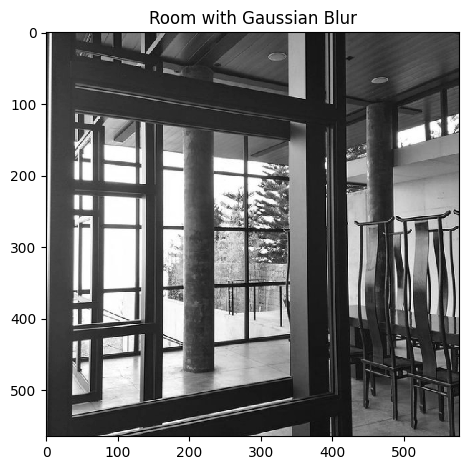

In [ ]:
# JAWABAN TUGAS 6
# TULISKAN KODE PROGRAM ANDA DI SINI

#inisiasi kernel Scharr Filter
scharr_hor = np.array([ [3, 10, 3],
                    [0, 0, 0],
                    [-3, -10, -3]])
scharr_ver = np.array([ [3, 0, -3],
                    [10, 0, -10],
                    [3, 0, -3]])

#memberi filter gauss pada morph (room.png)
  #Nilai pada masing-masing elemen kernel adalah 1/16
kernel_gaussian = np.array([[1,2,1],[2,4,2],[1,2,1]], dtype = int)/16

  #Proses konvolusi filter pada citra
gauss_morph_room = convolution2d(morph_gray,kernel_gaussian)

##Simpan citra hasil Gaussian Filter dan tampilkan
gauss_morph_room = gauss_morph_room.astype(np.uint8)
cv2.imwrite('gaussian_room.png', gauss_morph_room)
plt.title('Room with Gaussian Blur')
plt.imshow(gauss_morph_room, cmap="gray")

imshow(morph_gray);

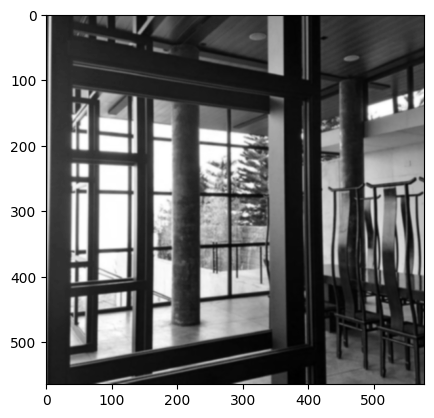

In [ ]:
#karena hasil konvolusi diatas tidak jelas, maka digunakan package cv2 untuk melakukan gaussian blur
cv2_blur = cv2.GaussianBlur(morph_gray,(5,5),0)
plt.imshow(cv2_blur, cmap='gray')

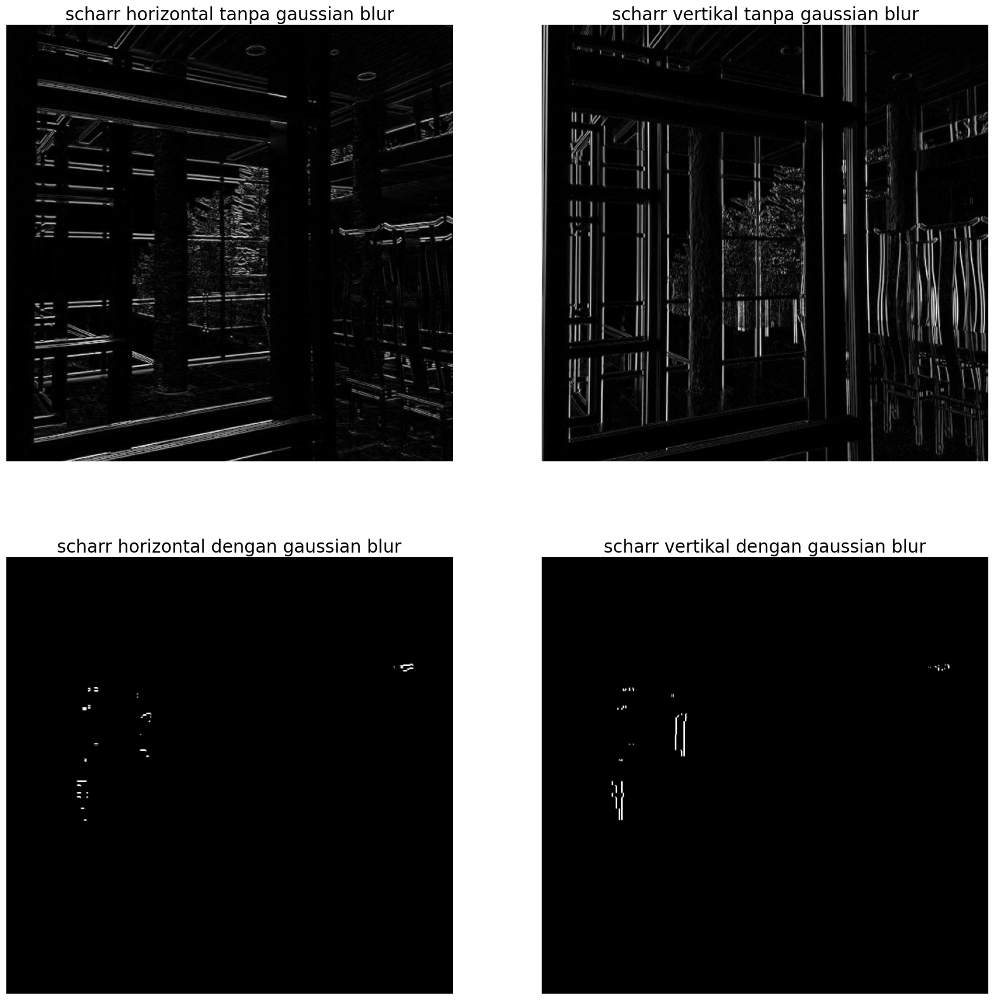

In [ ]:
#plot hasil citra dengan gaussian hasil konvolusi sendiri
fig, ax = plt.subplots(2, 2, figsize=(20,20))
ax[0, 0].set_title(f'scharr horizontal tanpa gaussian blur', fontsize = 20)
ax[0, 0].imshow(abs(convolution2d(morph_gray, scharr_hor)), cmap='gray')
ax[0, 0].set_axis_off()

ax[0, 1].set_title(f'scharr vertikal tanpa gaussian blur', fontsize = 20)
ax[0, 1].imshow(abs(convolution2d(morph_gray, scharr_ver)) , cmap='gray')
ax[0, 1].set_axis_off()

ax[1, 0].set_title(f'scharr horizontal dengan gaussian blur', fontsize = 20)
ax[1, 0].imshow(abs(convolution2d(gauss_morph_room, scharr_hor)), cmap='gray')
ax[1, 0].set_axis_off()

ax[1, 1].set_title(f'scharr vertikal dengan gaussian blur', fontsize = 20)
ax[1, 1].imshow(abs(convolution2d(gauss_morph_room, scharr_ver)) , cmap='gray')
ax[1, 1].set_axis_off()

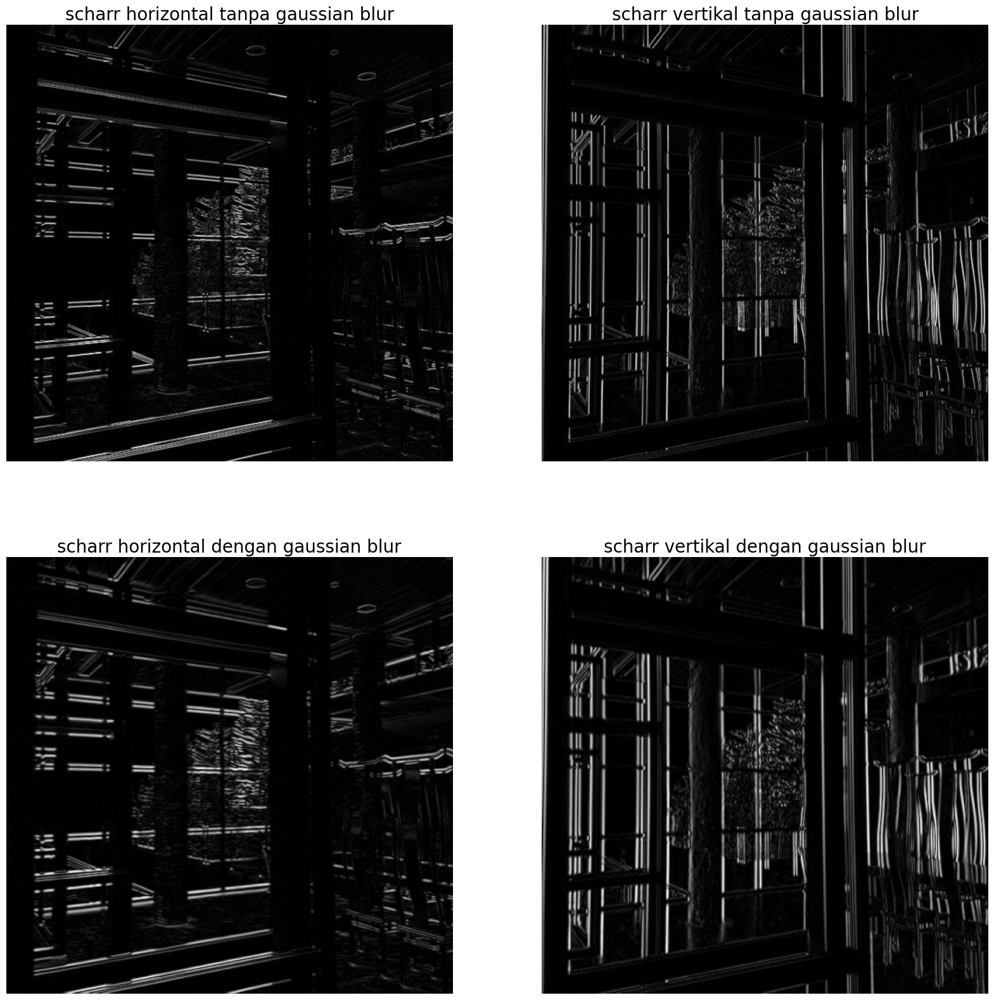

In [ ]:
#plot hasil citra tugas 6 versi gaussian cv2
fig, ax = plt.subplots(2, 2, figsize=(20,20))
ax[0, 0].set_title(f'scharr horizontal tanpa gaussian blur', fontsize = 20)
ax[0, 0].imshow(abs(convolution2d(morph_gray, scharr_hor)), cmap='gray')
ax[0, 0].set_axis_off()

ax[0, 1].set_title(f'scharr vertikal tanpa gaussian blur', fontsize = 20)
ax[0, 1].imshow(abs(convolution2d(morph_gray, scharr_ver)) , cmap='gray')
ax[0, 1].set_axis_off()

ax[1, 0].set_title(f'scharr horizontal dengan gaussian blur', fontsize = 20)
ax[1, 0].imshow(abs(convolution2d(cv2_blur, scharr_hor)), cmap='gray')
ax[1, 0].set_axis_off()

ax[1, 1].set_title(f'scharr vertikal dengan gaussian blur', fontsize = 20)
ax[1, 1].imshow(abs(convolution2d(cv2_blur, scharr_ver)) , cmap='gray')
ax[1, 1].set_axis_off()

#### **JAWABAN TUGAS 6 : tuliskan hasil analisis Anda**

Pada saat pengimplementasian gaussian blur pada citra room menggunakan metode convolution2d seperti tugas-tugas sebelumnya menghasilkan citra yang tidak jelas. Oleh karena itu, sebagai alternatif, digunakanlah package gaussian blur cv2.

Secara kasat mata, mungkin kita kesulitan melihat perbedaan antara citra yang diolah dengan gaussian blur terlebih dahulu dengan yang tidak. Akan tetapi, jika dilihat dengan lebih mendetail kita dapat menyimpulkan bahwa citra yang diberi gaussian blur terlebih dahulu memiliki garis tepi yang lebih halus dan lebih jelas (tebal). Gaussian blur ini berfungsi untuk mengaluskan gambar dan mengurangi noise-nya sehingga garis tepi hasil sobel filter dapat terlihat lebih jelas dan halus


Kernel Sobel biasanya digunakan untuk mendeteksi garis tepi atau edge pada gambar. Jika Sobel filter diterapkan pada gambar asli tanpa dilakukan proses smoothing terlebih dahulu, maka filter tersebut dapat memberikan hasil yang kasar dan kurang terdefinisi dengan baik. Hal ini terjadi karena filter Sobel sensitif terhadap noise dan detail kecil pada gambar.

Oleh karena itu, seringkali dilakukan proses smoothing terlebih dahulu dengan menggunakan filter Gaussian Blur sebelum Sobel filter diterapkan. Gaussian Blur dapat membantu menghaluskan dan mengurangi noise pada gambar. Dengan demikian, hasil Sobel filter dapat menjadi lebih jelas tetapi terlihat sedikit kabur.